# Ev.9:- Insurance Claim Fraud Detection

In [1]:
#Libraries to be used for model building
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Loading the csv file.
data=pd.read_csv("Automobile_insurance_fraud.csv")

In [3]:
# .head used for fetching first five rows 
data.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


# EXPLORATORY DATA ANALYSIS (EDA):-

In [4]:
# For checking how many rows and columns are there in dataset
data.shape

(1000, 40)

In this, there are 1000 rows and 40 columns present in the dataset.

In [5]:
# For checking the number of unique values :-
data.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [6]:
# For checking the Null/NAN values in the dataset:-
data.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In this, there is 1 column named _c39 which contains only NaN values,
so it is not required for further processes as it will affect model performance.

In [7]:
# For checking the information about the dataset:-
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

Here we can observe that there are no null values present in 39 out of 40 columns
In Column _c39 there are 0 non-null values,so there are no values present in this column so it should be dropped.

In [8]:
# For seeing the available columns in the dataset:-
data.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [9]:
# For dropping the not required column:-
data.drop("_c39",axis=1, inplace=True)

In [10]:
# For checking the datatype of all columns present in the dataset:-
data.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [11]:
# For checking the unique values present in all columns of the dataset:-
data.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In this, there are 2 columns Policy Number and incident location which has all the unique values, 
so it should be dropped to maintain model performance.

In [12]:
# For dropping the not required columns:-
data=data.drop(["policy_number","incident_location"],axis=1)

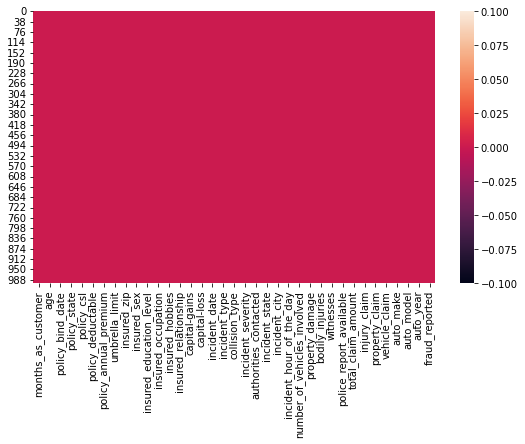

In [13]:
# For visualising and confirming presence of null values using heatmap:-
plt.figure(figsize=(9,5))
sns.heatmap(data.isnull())
plt.show()

As seen above, there are no null values present in dataset.

In [14]:
# For checking that there are any empty spaces or observations present in the dataset:-
data.loc[data['fraud_reported']== " "]

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported


Here, there are no empty space present in the dataset.

In [18]:
# For checking the value counts of each column present in the dataset:-
for i in data.columns:
    print(data[i].value_counts())
    print("-------")

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
-------
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
-------
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64
-------
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64
-------
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64
-------
100

Here, it is seen that in column umbrella_limit, almost 70 to 75% of values are zero, so, 0 values are not going to help in our prediction, so it should be dropped.

Also there are 50% 0 values present in the column capital-gains and capital-loss.

There is also value as '?' in collission type, property_damage, police_report_available

There is a column named insured_zip in this column values looks like some sort of id or code given to the insured person.

In [19]:
# For dropping the column with more than 70% 0 values:-
data=data.drop(["umbrella_limit"],axis=1)

In [20]:
# For checking the value counts of insured_zip:-
data[["insured_zip"]].value_counts()

insured_zip
431202         2
477695         2
446895         2
456602         2
469429         2
              ..
455426         1
455482         1
455672         1
455689         1
620962         1
Length: 995, dtype: int64

In [21]:
# Lets drop column insured_zip column from the dataset
data=data.drop(["insured_zip"],axis=1)

In [22]:
# For checking the statistical summary of all the columns in the dataset:-
data.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,611.864673,244.167395,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,500.000000,433.330000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,2000.000000,1415.695000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


Here, there is a difference in Mean and Median(50% percentile) in columns like months_as_customer, policy_deductable, capital-gains, capital-loss, number_of_vehicles_involved, witnesses, total_claim_amount, injury_claim, property_claim, vehicle_claim which denotes presence of skewness.

Also,there are presence of outliers as most of the columns have huge gap in 75 % and max.

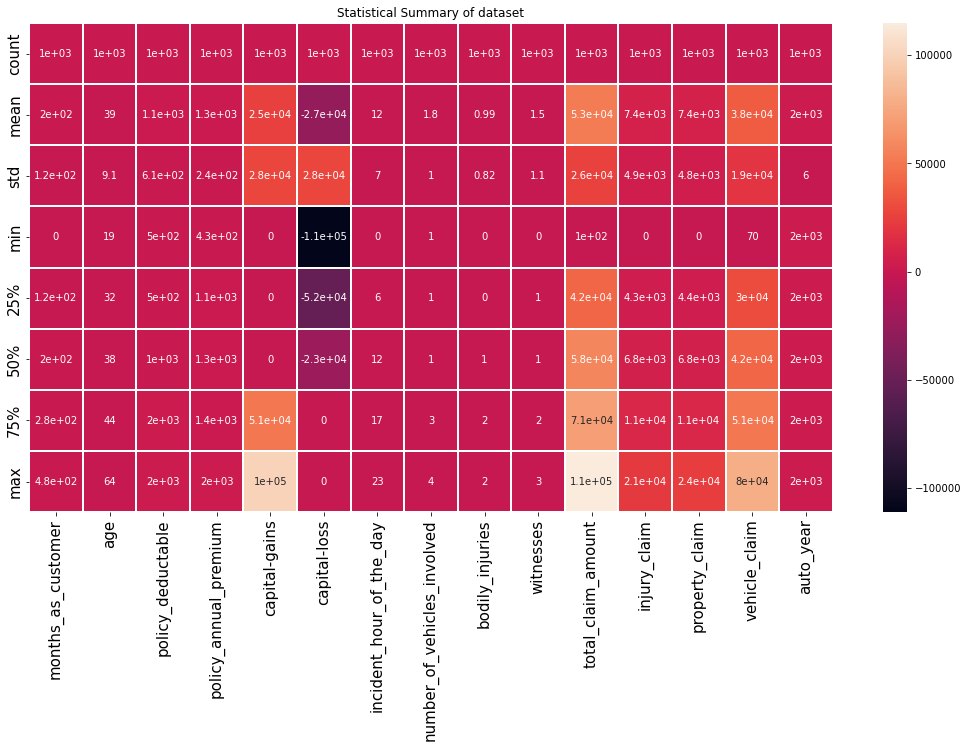

In [24]:
# For visualising the Statistical Description using heatmap:-

plt.figure(figsize=(18,9))
sns.heatmap(data.describe(),linewidth=.2, annot=True,fmt=".2g")
plt.title("Statistical Summary of dataset")
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [25]:
# For fetching Day, Month and Year from incident_date and Policy_bind_date column
# For changing datatype from object to datetime:-
data['incident_date']= pd.to_datetime(data['incident_date'])
data['policy_bind_date']=pd.to_datetime(data['policy_bind_date'])

In [26]:
# For checking data types of columns after conversion above:-
data.dtypes

months_as_customer                      int64
age                                     int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                         object
incident_city                          object
incident_hour_of_the_day          

In [27]:
# For extracting Day, Month and Year from date for better clarity further using Lambda function:-
data["incident_day"]=data["incident_date"].apply(lambda x:x.day)
data['incident_month']=data["incident_date"].apply(lambda x:x.month)
data['incident_year']=data['incident_date'].apply(lambda x:x.year)

In [28]:
# For extracting Day, Month and Year from date for better clarity further using Lambda function:-
data['policy_bind_day']=data['policy_bind_date'].apply(lambda x:x.day)
data['policy_bind_month']=data['policy_bind_date'].apply(lambda x:x.month)
data['policy_bind_year']=data['policy_bind_date'].apply(lambda x:x.year)

In [29]:
# For dropping original date columns:--
data.drop(['incident_date','policy_bind_date'], axis=1, inplace=True)

In [31]:
# For checking the value counts again after above findings:-
for i in data.columns:
    print(data[i].value_counts())
    print('-------------')

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
-------------
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
-------------
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64
-------------
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64
-------------
1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64
-------------
1558.29    2
1215.36    2
1362.87    2
1073.83    2
1389.13    2
          ..
1085.03    1
1437.33    1
988.29     1
1238.89 

Here, as seen above the column incident_year is having same value as 2015,
so it should he dropped as it will affect model accuracy further.

In [32]:
# For dropping incident_year column :-
data=data.drop(['incident_year'],axis=1)

In [33]:
# For replacing ? in collision type:-
data[data.columns[(data == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

In [34]:
# For replacing collision type value with Mode:-
data['collision_type'].mode()

0    Rear Collision
Name: collision_type, dtype: object

In [35]:
data['collision_type']=data.collision_type.str.replace('?','Rear Collision')

In [36]:
# Same with Property damage column as it is also a categorical column:-
data['property_damage'] = data.property_damage.str.replace('?', 'NO')

In [37]:
# Same with Policve report available column as it is also a categorical column:-
data['police_report_available'] = data.police_report_available.str.replace('?', 'NO')

# Performing Univariate Analysis:-

In [52]:
# For distributing our data into two variables i.e.category and integer:-
Category=[]
for i in data.dtypes.index:
    if data.dtypes[i]=="object":
        Category.append(i)
print(Category)

['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


In [53]:
# For distributing our data into two variables i.e.category and integer:-
Integer=[]
for i in data.dtypes.index:
    if data.dtypes[i]!="object":
        Integer.append(i)
print(Integer)

['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', 'incident_day', 'incident_month', 'policy_bind_day', 'policy_bind_month', 'policy_bind_year']


In this, the categorical and numerical has been seperated

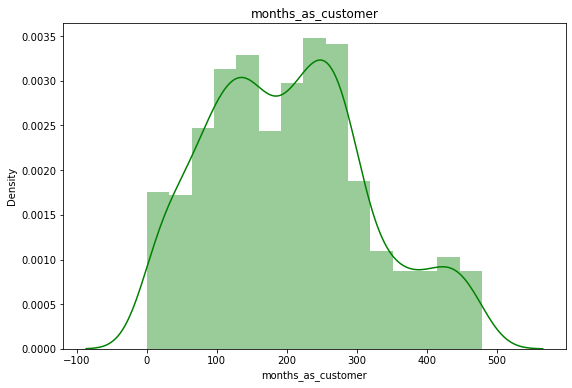

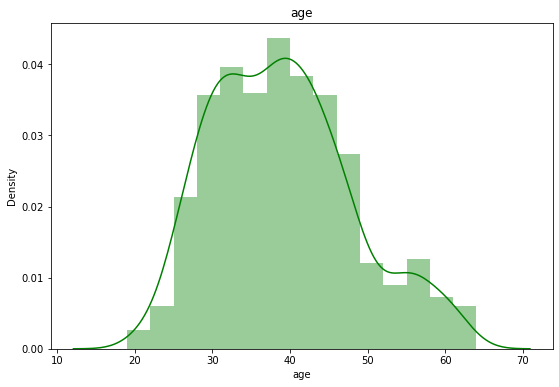

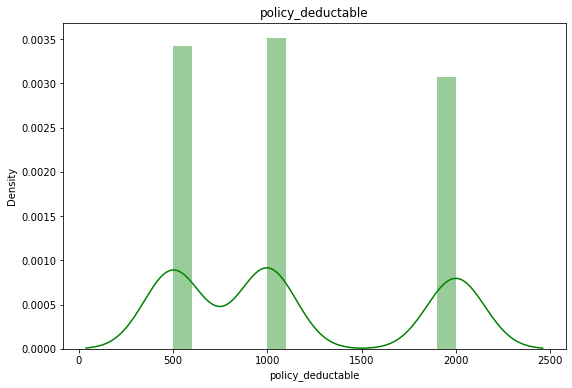

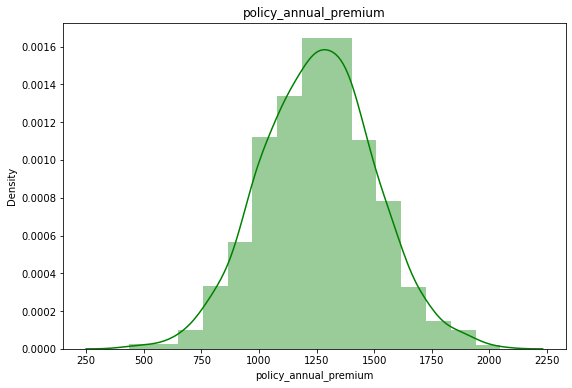

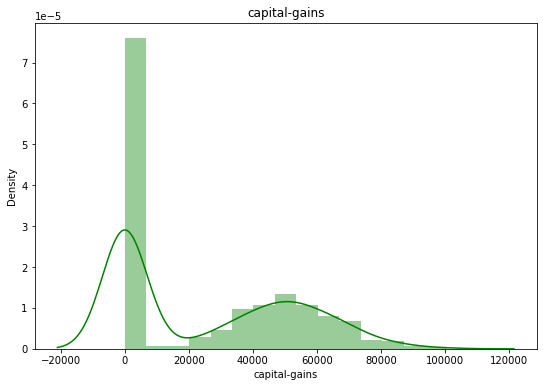

...

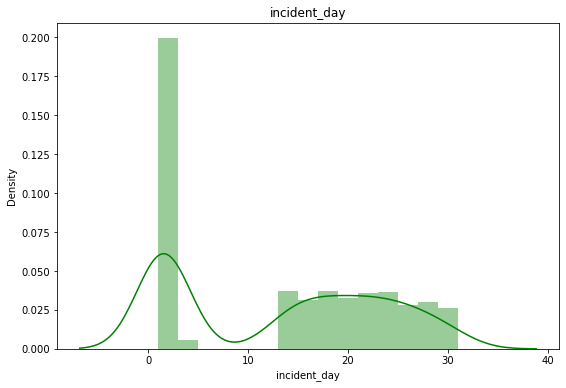

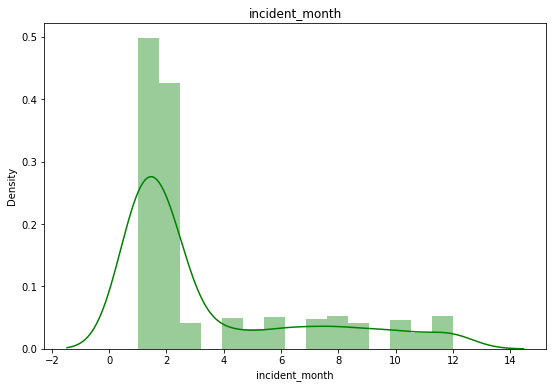

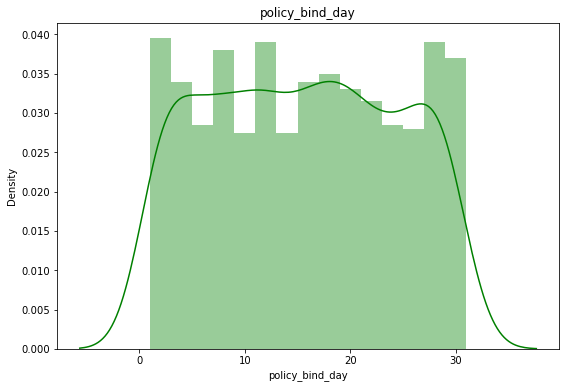

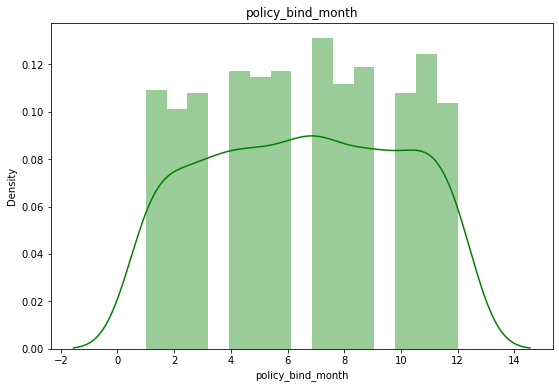

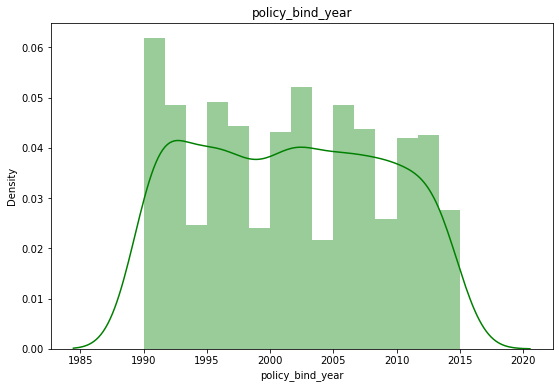

In [55]:
# For visualising Integer data using distplot method:-
for i in data[Integer]:
    plt.figure(figsize=(9,6))
    sns.distplot(data[i], color="g", bins=15)
    plt.title(i)
    plt.show()

Here, it is seen that few columns are skewed towards left, so we have to manage skewness here.

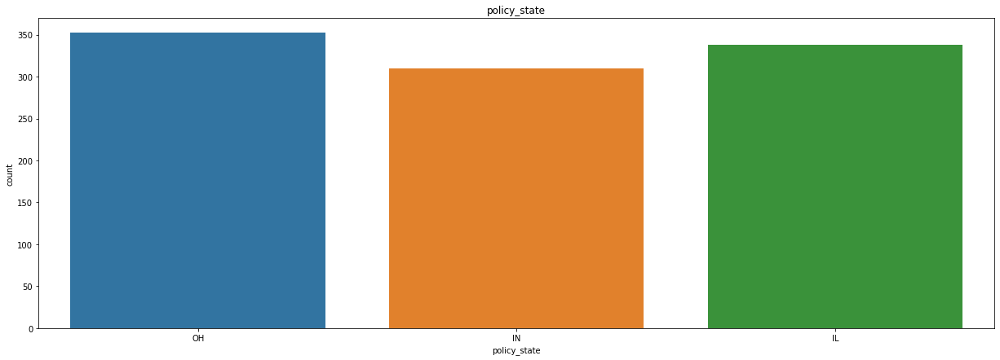

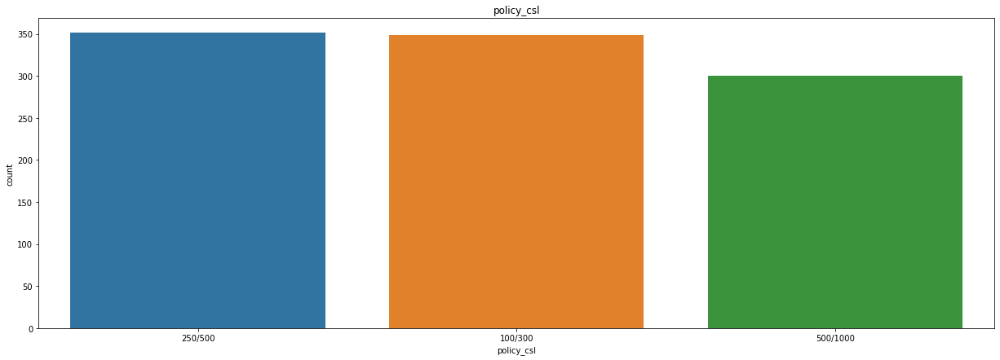

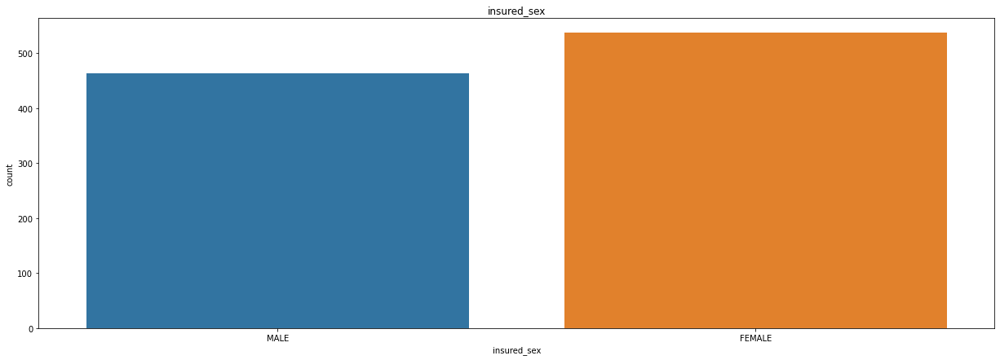

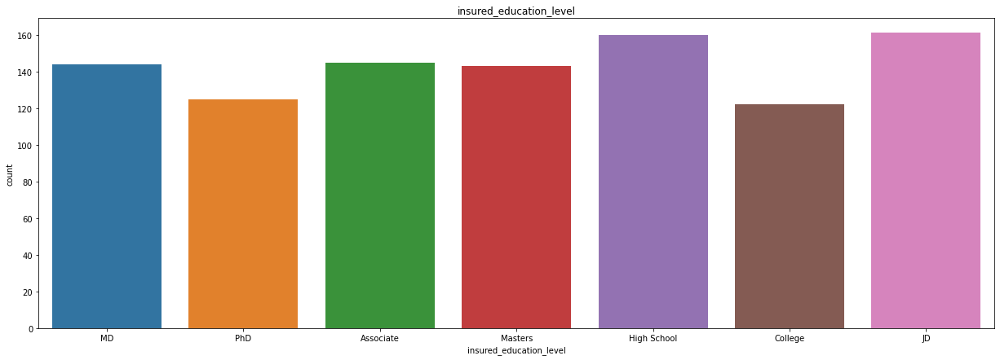

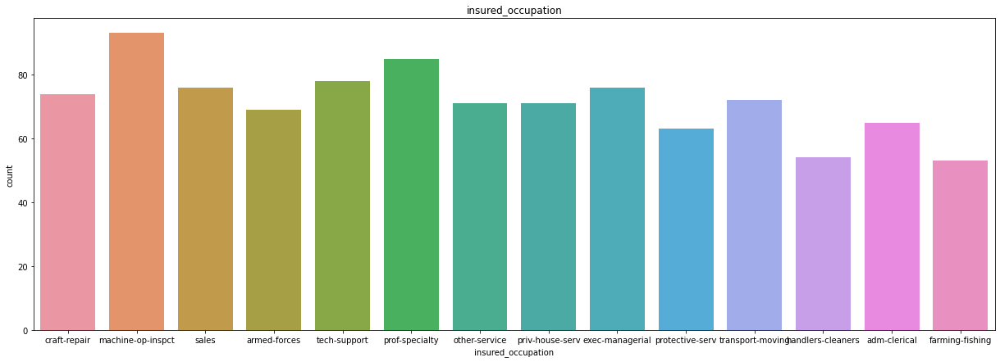

...

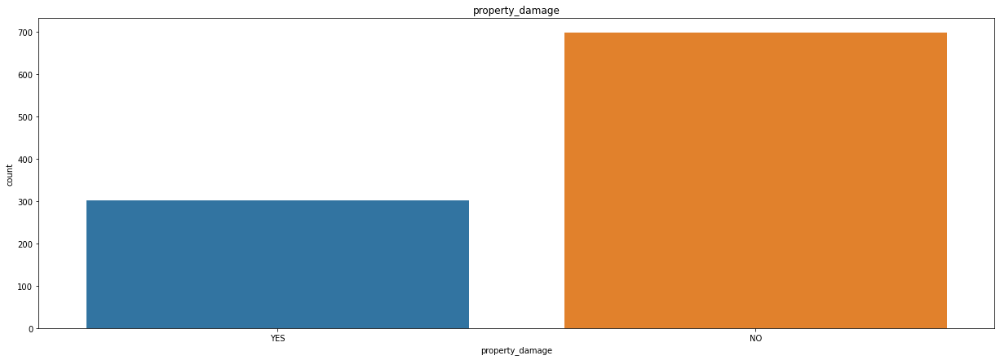

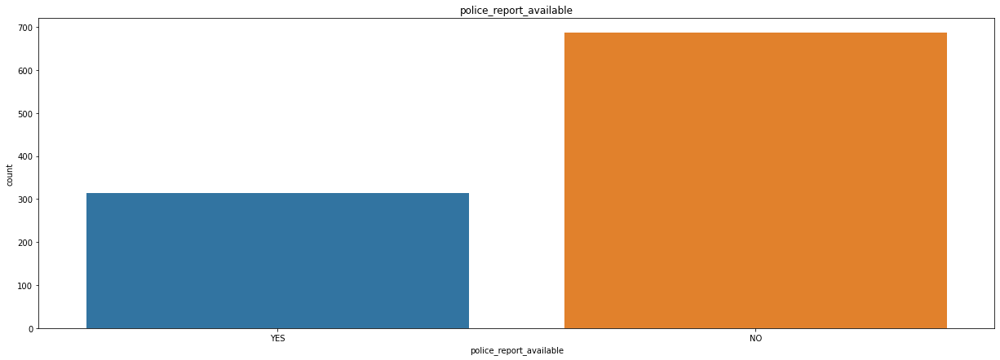

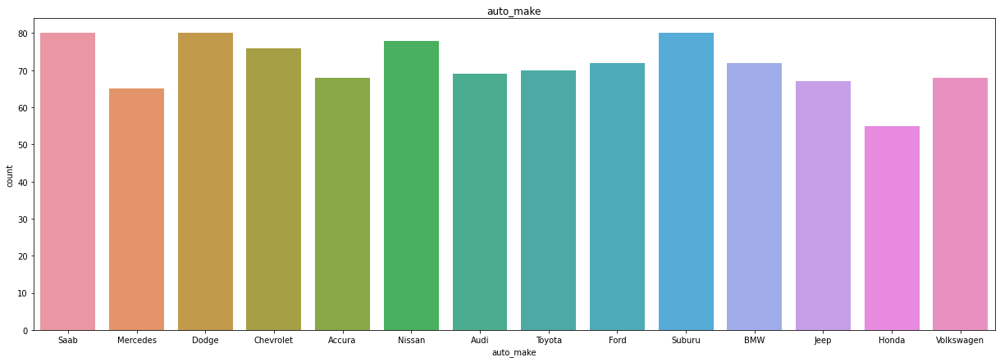

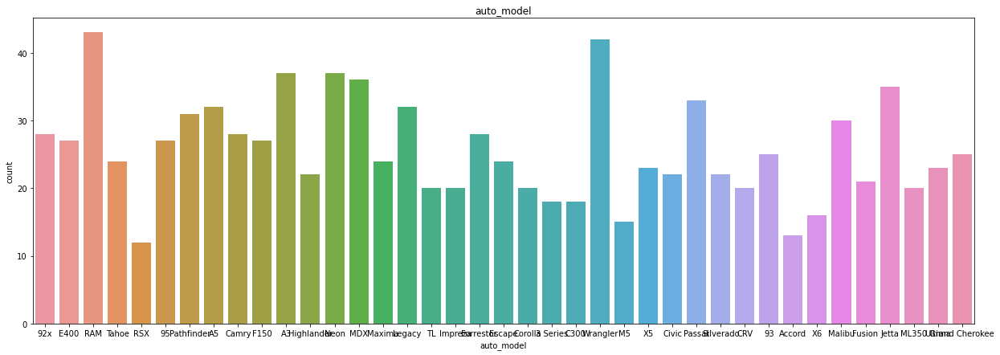

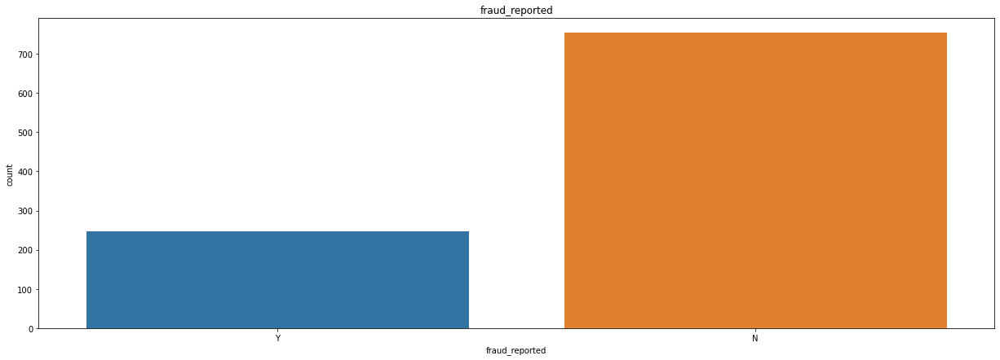

In [56]:
# For visualizing and checking columns in category using countplot:-

for i in data[Category]:
    plt.figure(figsize=(21,7))
    sns.countplot(data[i])
    plt.title(i)
    plt.show()

Here, policy_state count is on a higher side.

Female insured are more in number. .

It is also seen that Multi-vehicle-collision and single-vehicle-collision are more in number.
We can see that Rather than front and side collision Rear Collision has maximum count.

Here it is seen clearly that Minor damage has maximum count compared to Trivial damage.
here it is seen clearly that Police authorities are contacted the most times.
Here it is seen clearly that In NY state most of the cases are registered.

In all the cities the insured climb are almost similar.

# Bivariate Analysis:-

<AxesSubplot:title={'center':'Comparision between months_as_customer and total_claim_amount'}, xlabel='months_as_customer', ylabel='total_claim_amount'>

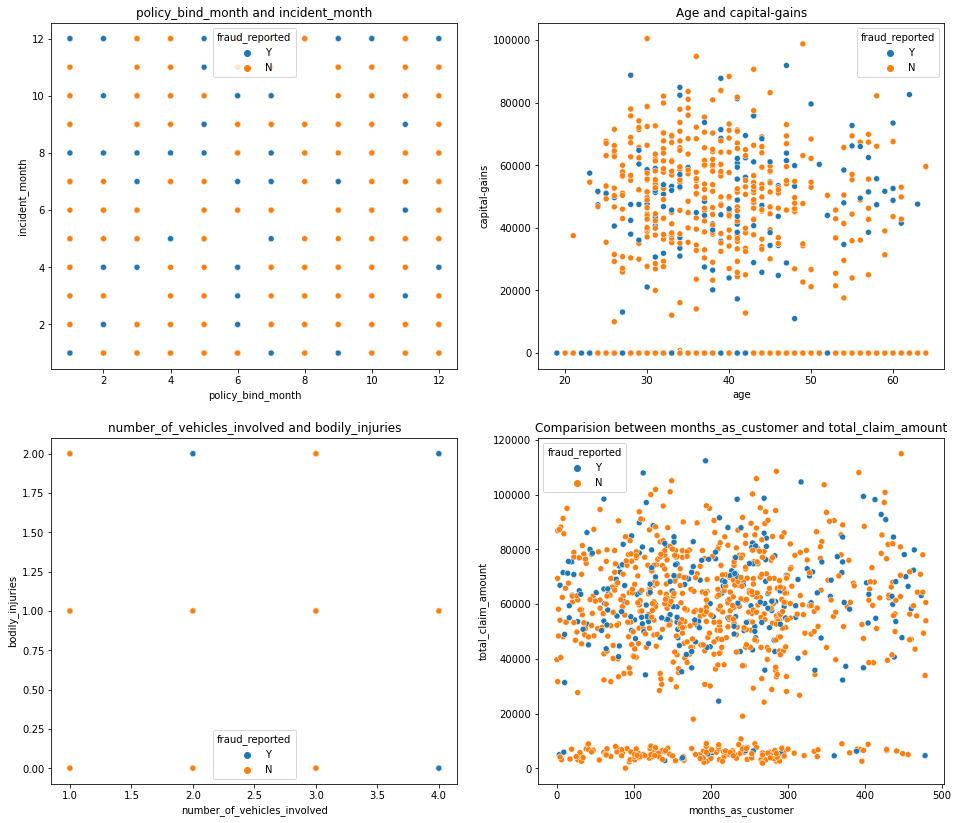

In [57]:
# For comparing among features with hue as Target using scatter plot method:-
plt.figure(figsize=[16,14])

plt.subplot(2,2,1)
plt.title('policy_bind_month and incident_month')
sns.scatterplot(data['policy_bind_month'],data['incident_month'],hue=data['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Age and capital-gains')
sns.scatterplot(data['age'],data['capital-gains'],hue=data['fraud_reported']);

plt.subplot(2,2,3)
plt.title('number_of_vehicles_involved and bodily_injuries')
sns.scatterplot(data['number_of_vehicles_involved'],data['bodily_injuries'],hue=data['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(data['months_as_customer'],data['total_claim_amount'],hue=data['fraud_reported'])

Here in first, it is seen that chances of reporting fraud is more in 1st 7 months.

Also, it is seen that capital gains are high from age 25 and below 50.

In Third plot, it is seen that only about 25% frauds are reported.

In 4th plot, it is seen that with a few people didnt claimed the insurance amount.

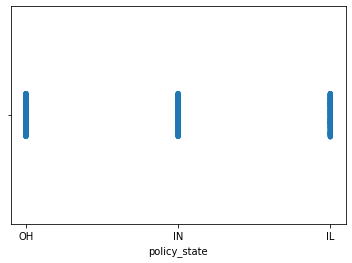

In [60]:
# For visualising Strip plot for policy_state with hue as fraud_reported:-
sns.stripplot('policy_state',data=data,hue='fraud_reported')
plt.xticks(rotation=0);

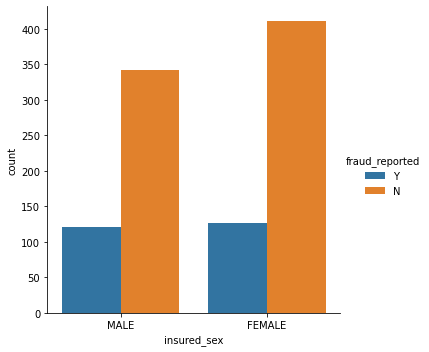

In [61]:
# For visualising using Factor plot method for insured_sex:-
sns.factorplot('insured_sex',kind='count',data=data,hue='fraud_reported')
plt.xticks(rotation=0);

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'craft-repair'),
  Text(1, 0, 'machine-op-inspct'),
  Text(2, 0, 'sales'),
  Text(3, 0, 'armed-forces'),
  Text(4, 0, 'tech-support'),
  Text(5, 0, 'prof-specialty'),
  Text(6, 0, 'other-service'),
  Text(7, 0, 'priv-house-serv'),
  Text(8, 0, 'exec-managerial'),
  Text(9, 0, 'protective-serv'),
  Text(10, 0, 'transport-moving'),
  Text(11, 0, 'handlers-cleaners'),
  Text(12, 0, 'adm-clerical'),
  Text(13, 0, 'farming-fishing')])

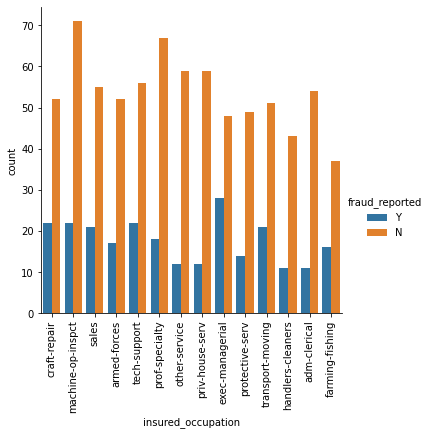

In [62]:
# For visualising using barplot method for insured_occupation column:-
sns.factorplot('insured_occupation',kind='count',data=data,hue='fraud_reported')
plt.xticks(rotation=90)

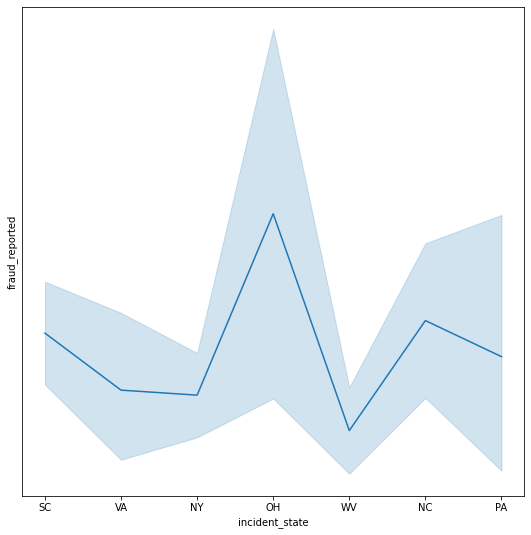

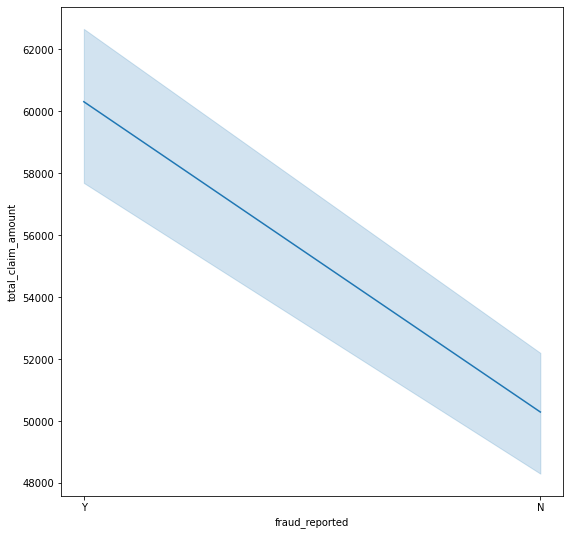

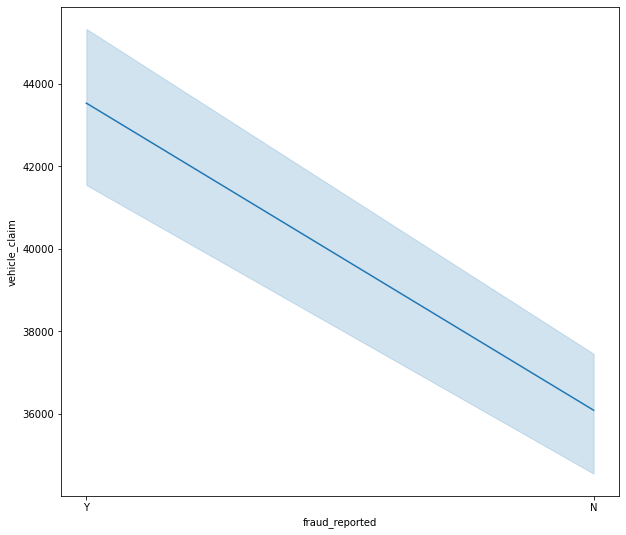

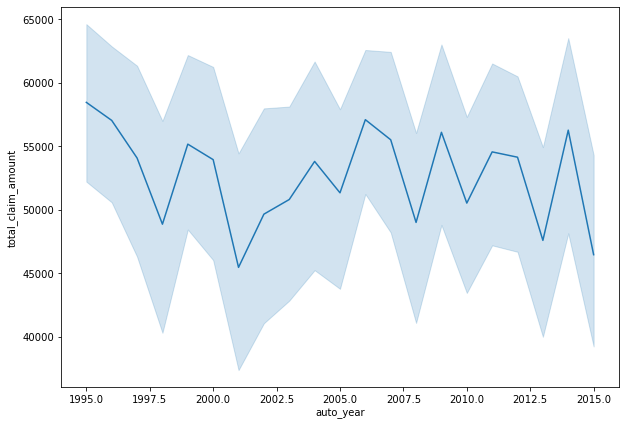

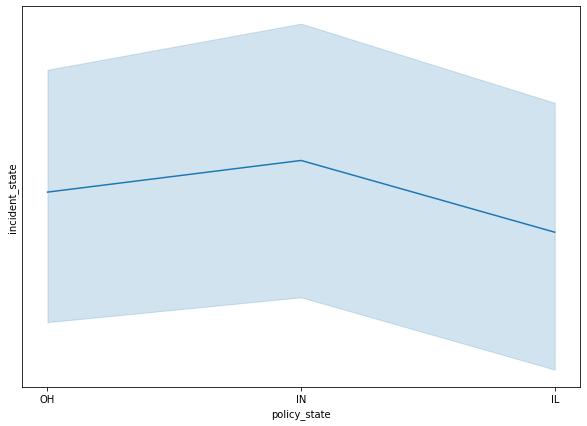

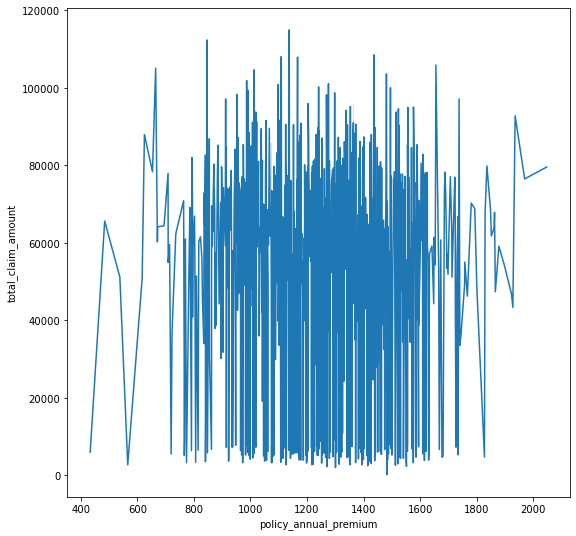

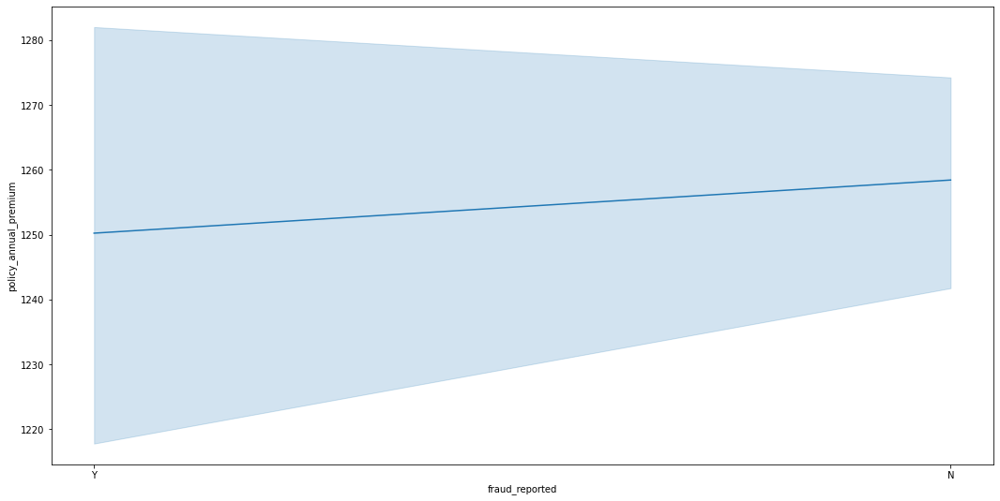

In [63]:
# For visulaising using line plot method:-
plt.figure(figsize=(9,9))
sns.lineplot(y="fraud_reported",x="incident_state",data=data)
plt.show()

plt.figure(figsize=(9,9))
sns.lineplot(x="fraud_reported",y="total_claim_amount",data=data)
plt.show()

plt.figure(figsize=(10,9))
sns.lineplot(x="fraud_reported",y="vehicle_claim",data=data)
plt.show()

plt.figure(figsize=(10,7))
sns.lineplot(x="auto_year",y="total_claim_amount",data=data)
plt.show()

plt.figure(figsize=(10,7))
sns.lineplot(x="policy_state",y="incident_state",data=data)
plt.show()

plt.figure(figsize=(9,9))
sns.lineplot(x="policy_annual_premium",y="total_claim_amount",data=data)
plt.show()

plt.figure(figsize=(18,9))
sns.lineplot(x="fraud_reported",y="policy_annual_premium",data=data)
plt.show()

Here we can see that most frauds were reported from state CH and least were reported from the state Wv.

Here, it is seen that correlation between total_amount claim and fraud_reported.

The correlation between vehicle_claim and fraud_reported is seen.

Correlation betwee total_claim_amount and auto_year,it is seen that most of the amount claimed was for automobile manufactured in 2006 and before 1995.

Also, most of the people pay annual premium in the range of 800 to 1600 dollor per annum.

There is no relation between policy annual premium and fraud_reported at all.

# MultiVariate Analysis:-

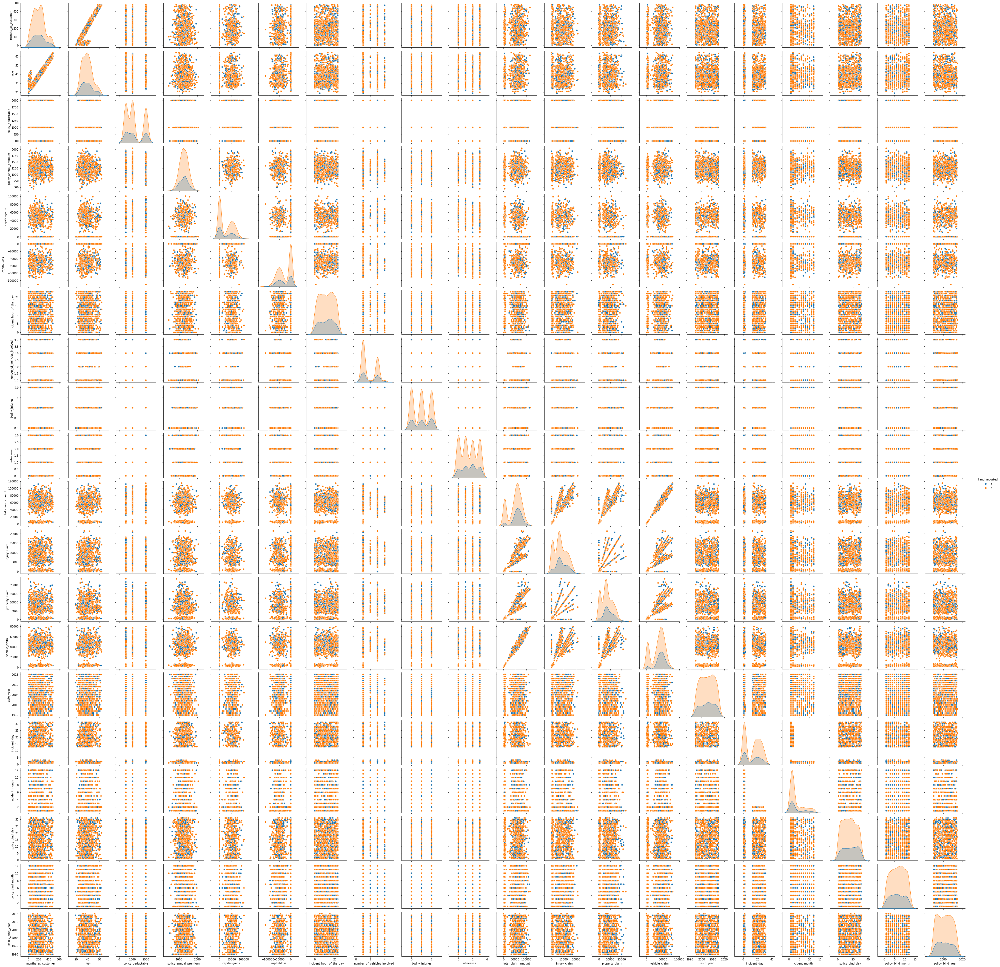

In [64]:
# For visualising correlation between columns using pairplot:-
sns.pairplot(data,hue="fraud_reported")

<AxesSubplot:>

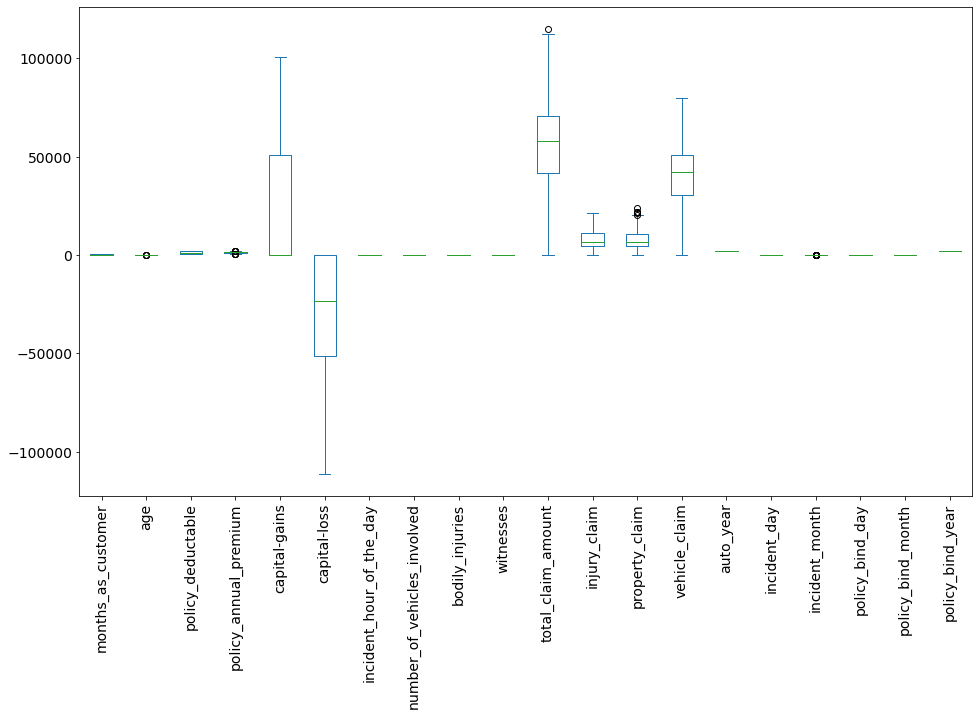

In [65]:
# For checking the presence of outliers using boxplot Method:-
data.plot(rot = 90,kind='box',fontsize=14,figsize=(16,9))

Here, as seen above outliers are present in approx. 4-5 columns so we will remove it.

In [67]:
# For making a list of columns with outliers:-
Feature=data[['age','policy_annual_premium','total_claim_amount','property_claim','incident_month']]

In [68]:
# For importing all required libraries for removal of outliers:-
from scipy.stats import zscore
z=np.abs(zscore(Feature))
data1=data[(z<3).all(axis=1)]
data1

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,incident_day,incident_month,policy_bind_day,policy_bind_month,policy_bind_year
0,328,48,OH,250/500,1000,1406.91,MALE,MD,craft-repair,sleeping,...,52080,Saab,92x,2004,Y,25,1,17,10,2014
1,228,42,IN,250/500,2000,1197.22,MALE,MD,machine-op-inspct,reading,...,3510,Mercedes,E400,2007,Y,21,1,27,6,2006
2,134,29,OH,100/300,2000,1413.14,FEMALE,PhD,sales,board-games,...,23100,Dodge,RAM,2007,N,22,2,9,6,2000
3,256,41,IL,250/500,2000,1415.74,FEMALE,PhD,armed-forces,board-games,...,50720,Chevrolet,Tahoe,2014,Y,1,10,25,5,1990
4,228,44,IL,500/1000,1000,1583.91,MALE,Associate,sales,board-games,...,4550,Accura,RSX,2009,N,17,2,6,6,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,FEMALE,Masters,craft-repair,paintball,...,61040,Honda,Accord,2006,N,22,2,16,7,1991
996,285,41,IL,100/300,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,...,72320,Volkswagen,Passat,2015,N,24,1,1,5,2014
997,130,34,OH,250/500,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,...,52500,Suburu,Impreza,1996,N,23,1,17,2,2003
998,458,62,IL,500/1000,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,...,36540,Audi,A5,1998,N,26,2,18,11,2011


In [69]:
# For checking the shape of new dataset after outliers removal:-
data1.shape

(996, 38)

Here, it is seen that new data has 996 rows and 38 columns and earlier we had 1000 rows, so we have lost 4 rows to remove outliers from the dataset.

In [70]:
# For checking the dataloss using zscore method:-
loss=(((data.shape[0]-data1.shape[0])/data.shape[0])*100)
loss

0.4

In [72]:
# For checking the skewness :-
data1.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductable              0.473229
policy_annual_premium          0.032042
capital-gains                  0.478850
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
bodily_injuries                0.011117
witnesses                      0.025758
total_claim_amount            -0.593473
injury_claim                   0.267970
property_claim                 0.357130
vehicle_claim                 -0.619755
auto_year                     -0.049276
incident_day                   0.055659
incident_month                 1.377097
policy_bind_day                0.028923
policy_bind_month             -0.029722
policy_bind_year               0.058499
dtype: float64

Here, skewness is present in 3 columns total_claim_amount, vehicle_claim, incident_month, 
so it needs to be reduced to acceptable parameters.

In [73]:
# For removing skewness using yeo-johnson method and to seperate features having skewness in a different variable:-
skewness=["total_claim_amount","vehicle_claim", "incident_month"]

In [74]:
# For importing required libraries:-
from sklearn.preprocessing import PowerTransformer
scaler=PowerTransformer(method='yeo-johnson')
'''
parameters:
method='box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod='box_cox' or 'yeo-johnson'\n"

In [75]:
data1[skewness]=scaler.fit_transform(data1[skewness].values)

In [76]:
# lets check the skewness again
data1[skewness].skew()

total_claim_amount   -0.508953
vehicle_claim        -0.521354
incident_month        0.305741
dtype: float64

Now, the skewness has been lowered and it is under acceptable limit.

# Encoding Techniques:-

In [78]:
# For separating categorical column in new dataset:-
Category1=[]
for i in data1.dtypes.index:
    if data1.dtypes[i]=='object':
        Category1.append(i)
print(Category1)

['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


In [79]:
# For importing required libraries for encoding:-
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
data1[Category1]=data1[Category1].apply(le.fit_transform)
data1[Category1].head()

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,2,1,1,4,2,17,0,2,2,0,4,4,1,1,1,10,1,1
1,1,1,1,4,6,15,2,3,1,1,4,5,5,0,0,8,12,1
2,2,0,0,6,11,2,3,0,1,1,4,1,1,0,0,4,30,0
3,0,1,0,6,1,2,4,2,0,0,4,2,0,0,0,3,34,1
4,0,2,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0


Here, all the categorical columns has been converted to numerical data for proceeding further.

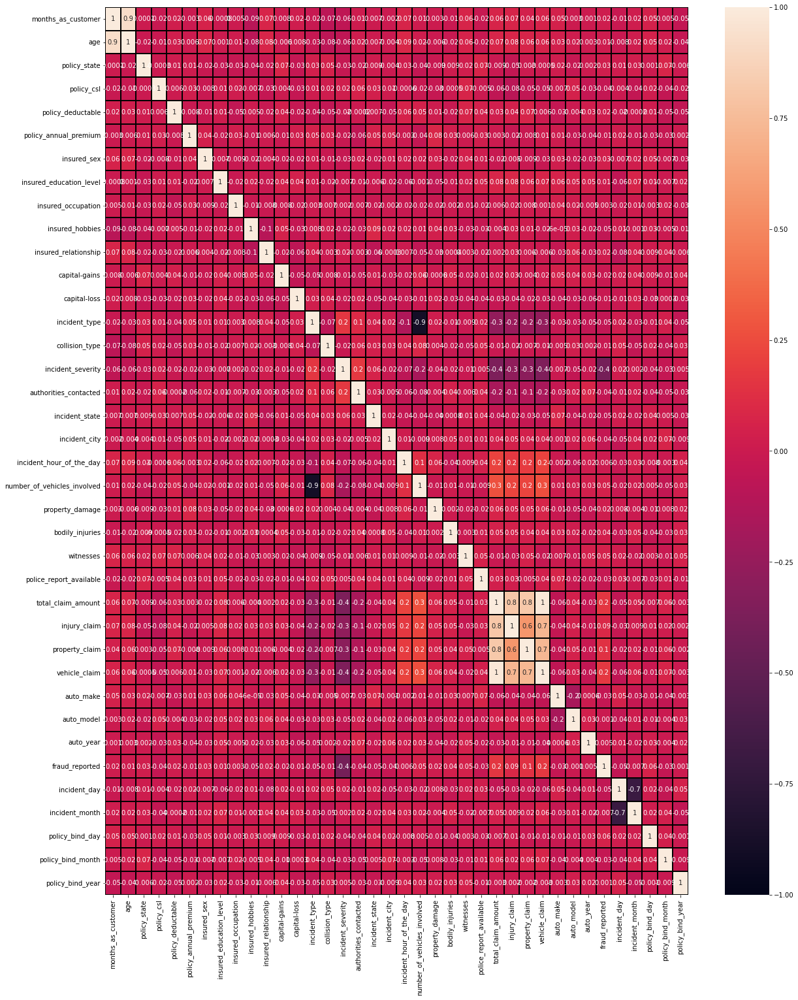

In [80]:
# For checking Correlation using heatmap method:-
plt.figure(figsize=(20,25))
sns.heatmap(data1.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g', annot = True, linecolor="black",annot_kws={'size':10})
plt.yticks(rotation=0);

Here, there is a multicolinearity issue between incident type and number_of_vehicles_invovled.

There is a multicolinearity issue between incident_month and incident_day.

There is a multicolinearity issue between total_claim_amount and injury_claim.

There is a multicolinearity issue between total_claim_amount and property_claim.

There is a multicolinearity issue between injury_claim and vehicle_claim.
There is a multicolinearity issue between total_claim_amount and vehicle_claim.
There is a multicolinearity issue between vehicle_claim and property_claim.
There is a multicolinearity issue between total_claim_amount and property_claim.

# SCALING TECHNIQUES:-

In [81]:
# For assigning features to x and Target to y
x=data1.drop('fraud_reported', axis=1)
y=data1['fraud_reported']

In [82]:
# For Scaling the data using standard scaler method:-
# For importing required Libraries:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x), columns=x.columns)

In [83]:
# For checking the Feature data:-
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,incident_day,incident_month,policy_bind_day,policy_bind_month,policy_bind_year
0,1.074671,0.987190,1.186130,0.063660,-0.224722,0.621371,1.075102,0.531088,-1.162296,1.280299,...,1.174449,0.754553,0.857248,-1.644810,-0.182338,1.139807,-1.101370,0.177487,1.013751,1.686176
1,0.204846,0.330455,-0.018137,0.063660,1.409024,-0.251375,1.075102,0.531088,-0.166257,0.928186,...,-1.376935,-1.787353,0.360986,-0.657437,0.316587,0.756374,-1.101370,1.309223,-0.166145,0.599693
2,-0.612790,-1.092470,1.186130,-1.179582,1.409024,0.647301,-0.930144,1.557206,1.078792,-1.360550,...,-0.737005,-0.820820,-0.631538,0.958263,0.316587,0.852233,-0.026479,-0.727901,-0.166145,-0.215170
3,0.448397,0.221000,-1.222403,0.063660,1.409024,0.658123,-0.930144,1.557206,-1.411305,-1.360550,...,-0.217973,0.678427,-0.879669,1.317308,1.480744,-1.160788,1.553647,1.082875,-0.461119,-1.573274
4,0.204846,0.549367,-1.222403,1.306902,-0.224722,1.358059,1.075102,-1.521148,1.078792,-1.360550,...,-1.404033,-1.740710,-1.624063,1.048024,0.649203,0.372942,-0.026479,-1.067422,-0.166145,1.686176


#  Fixing Multicollinearity :-

In [84]:
# For importing all required libraries:-
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Feat"]=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["Feat"]=x.columns
vif

,vif_Feat,Feat
0,6.849914,months_as_customer
1,6.853914,age
2,1.038059,policy_state
3,1.036285,policy_csl
4,1.045468,policy_deductable
5,1.037201,policy_annual_premium
6,1.031779,insured_sex
7,1.047028,insured_education_level
8,1.017436,insured_occupation
9,1.051074,insured_hobbies


Here,some features are exceeding the acceptable limit of VIF,those columns are:- total_claim_amount, injury_claim, property_claim, vehicle_claim. 

In [85]:
# For Dropping high Vif columns from the new dataset:-
x=x.drop(["total_claim_amount"],axis=1)

In [86]:
vif=pd.DataFrame()
vif["vif_Feat"]=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["Feat"]=x.columns
vif

,vif_Feat,Feat
0,6.848162,months_as_customer
1,6.853796,age
2,1.038032,policy_state
3,1.035288,policy_csl
4,1.043956,policy_deductable
5,1.036484,policy_annual_premium
6,1.028886,insured_sex
7,1.046976,insured_education_level
8,1.016725,insured_occupation
9,1.049212,insured_hobbies


Now after dropping column, 
all the values are aligned within limit.Multicollinearity issue is fixed here

# Data Balancing using Oversampling:-

In [87]:
# For checking the value count of target column
y.value_counts()

0    750
1    246
Name: fraud_reported, dtype: int64

In [88]:
# For importing all required libraries and balancing the data:-
from imblearn.over_sampling import SMOTE
sm=SMOTE()
x,y =sm.fit_resample(x,y)

In [89]:
# For checking the value_counts once again after balancing:-
y.value_counts()

1    750
0    750
Name: fraud_reported, dtype: int64

Here, data has been balanced properly using SMOTE method.

# Finding the Best Random State:-

In [90]:
# For finding the Best Random State, accuracy and importing all required libraries:-
from sklearn.metrics import accuracy_score, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier

In [91]:
# For finding the Best Random state and accuracy score:-
Max_acc=0
Max_rs=0
for i in range(1,250):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.27,random_state=i )
    Model=RandomForestClassifier()
    Model.fit(x_train,y_train)
    pred=Model.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>Max_acc:
        Max_acc=acc
        Max_rs=i
print("Best accuracy is ",Max_acc,"on random_state ",Max_rs)

Best accuracy is  0.9209876543209876 on random_state  58


In [93]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.25,random_state=58)

# Classification Model Building:-

In [94]:
# For importing all required libraries for model selection:-
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier as KNN

In [95]:
# For checking accuracy score with 1st Algorithm:- KNeighborsClassifier:-
knn=KNN()
knn.fit(x_train,y_train)
predknn=knn.predict(x_test)
print("Accuracy Score: ", accuracy_score(y_test,predknn))
print("Confusion Matrix: ",confusion_matrix(y_test,predknn))
print(classification_report(y_test,predknn))

Accuracy Score:  0.64
Confusion Matrix:  [[ 62 132]
 [  3 178]]
              precision    recall  f1-score   support

           0       0.95      0.32      0.48       194
           1       0.57      0.98      0.73       181

    accuracy                           0.64       375
   macro avg       0.76      0.65      0.60       375
weighted avg       0.77      0.64      0.60       375



Here, the accuracy score is 64 %

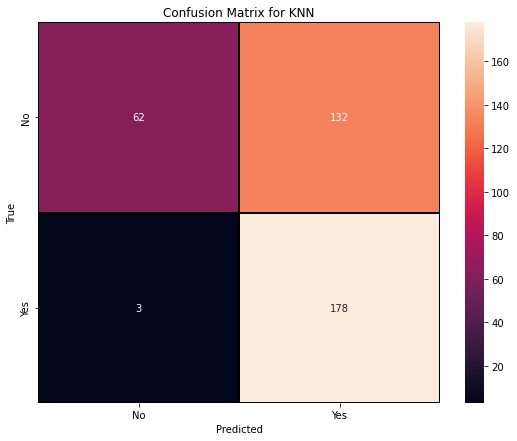

In [97]:
# For checking confusion Matrix of above model:-
CM=confusion_matrix(y_test,predknn)
x_axis_labels= ["No","Yes"]
y_axis_labels= ["No","Yes"]
f,ax = plt.subplots(figsize=(9,7))
sns.heatmap(CM, annot=True, linewidth=.2, linecolor="black",fmt='.0f',ax=ax, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for KNN')
plt.show()

In [100]:
# For checking with 2nd algorithm:- ExtraTrees Classifier
ETC=ExtraTreesClassifier()
ETC.fit(x_train,y_train)
predETC=ETC.predict(x_test)
print("Accuracy Score: ", accuracy_score(y_test,predETC))
print("Confusion Matrix: ",confusion_matrix(y_test,predETC))
print(classification_report(y_test,predETC))

Accuracy Score:  0.9333333333333333
Confusion Matrix:  [[178  16]
 [  9 172]]
              precision    recall  f1-score   support

           0       0.95      0.92      0.93       194
           1       0.91      0.95      0.93       181

    accuracy                           0.93       375
   macro avg       0.93      0.93      0.93       375
weighted avg       0.93      0.93      0.93       375



Here, the accuracy score is coming 93.3 %

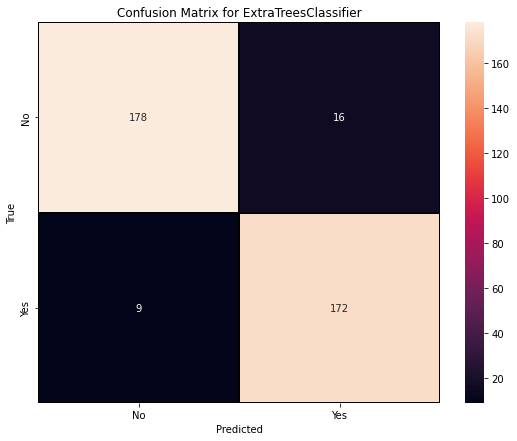

In [103]:
# For checking confusion Matrix of above model:-
CM1=confusion_matrix(y_test,predETC)
x_axis_labels= ["No","Yes"]
y_axis_labels= ["No","Yes"]
f,ax = plt.subplots(figsize=(9,7))
sns.heatmap(CM1, annot=True, linewidth=.2, linecolor="black",fmt='.0f',ax=ax, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for ExtraTreesClassifier')
plt.show()

In [102]:
# For checking with 3rd algorithm:- GradientBoosting Classifier
gbc=GradientBoostingClassifier()
gbc.fit(x_train,y_train)
predgbc=gbc.predict(x_test)
print("Accuracy Score: ", accuracy_score(y_test,predgbc))
print("Confusion Matrix: ",confusion_matrix(y_test,predgbc))
print(classification_report(y_test,predETC))

Accuracy Score:  0.928
Confusion Matrix:  [[176  18]
 [  9 172]]
              precision    recall  f1-score   support

           0       0.95      0.92      0.93       194
           1       0.91      0.95      0.93       181

    accuracy                           0.93       375
   macro avg       0.93      0.93      0.93       375
weighted avg       0.93      0.93      0.93       375



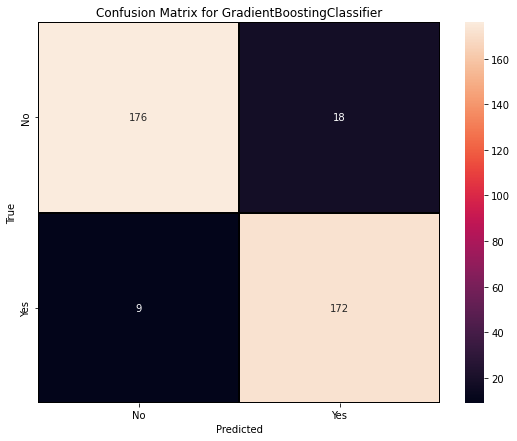

In [104]:
# For checking confusion Matrix of above model:-
CM2=confusion_matrix(y_test,predgbc)
x_axis_labels= ["No","Yes"]
y_axis_labels= ["No","Yes"]
f,ax = plt.subplots(figsize=(9,7))
sns.heatmap(CM2, annot=True, linewidth=.2, linecolor="black",fmt='.0f',ax=ax, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for GradientBoostingClassifier')
plt.show()

In [105]:
# For checking accuracy with 4th algorithm:- DecisionTreeClassifier
DTC=DecisionTreeClassifier()
DTC.fit(x_train,y_train)
predDTC=DTC.predict(x_test)
print("Accuracy Score: ", accuracy_score(y_test,predDTC))
print("Confusion Matrix: ",confusion_matrix(y_test,predDTC))
print(classification_report(y_test,predDTC))

Accuracy Score:  0.872
Confusion Matrix:  [[169  25]
 [ 23 158]]
              precision    recall  f1-score   support

           0       0.88      0.87      0.88       194
           1       0.86      0.87      0.87       181

    accuracy                           0.87       375
   macro avg       0.87      0.87      0.87       375
weighted avg       0.87      0.87      0.87       375



Here, the accuracy score is 87.2 %

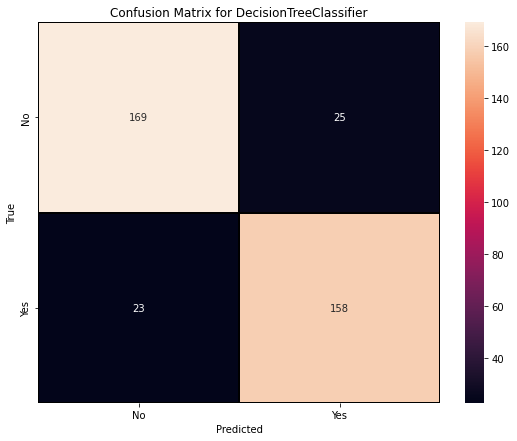

In [107]:
# For checking confusion Matrix of above model:-
CM3=confusion_matrix(y_test,predDTC)
x_axis_labels= ["No","Yes"]
y_axis_labels= ["No","Yes"]
f,ax = plt.subplots(figsize=(9,7))
sns.heatmap(CM3, annot=True, linewidth=.2, linecolor="black",fmt='.0f',ax=ax, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for DecisionTreeClassifier')
plt.show()

In [108]:
# For checking accuracvy with 5th Model:- RandomForestClassifier
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)
predRFC=rfc.predict(x_test)
print("Accuracy Score: ", accuracy_score(y_test,predRFC))
print("Confusion Matrix: ",confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

Accuracy Score:  0.912
Confusion Matrix:  [[177  17]
 [ 16 165]]
              precision    recall  f1-score   support

           0       0.92      0.91      0.91       194
           1       0.91      0.91      0.91       181

    accuracy                           0.91       375
   macro avg       0.91      0.91      0.91       375
weighted avg       0.91      0.91      0.91       375



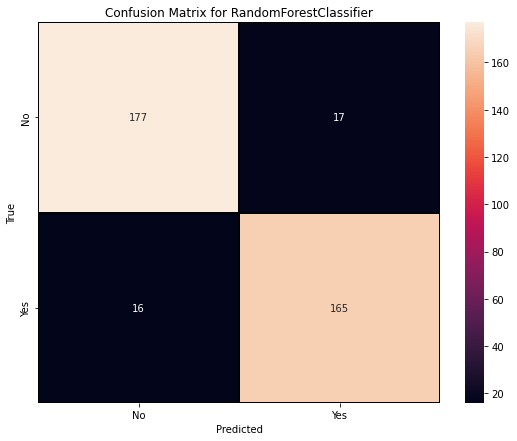

In [110]:
# For checking confusion Matrix of above model:-
CM4=confusion_matrix(y_test,predRFC)
x_axis_labels= ["No","Yes"]
y_axis_labels= ["No","Yes"]
f,ax = plt.subplots(figsize=(9,7))
sns.heatmap(CM4, annot=True, linewidth=.2, linecolor="black",fmt='.0f',ax=ax, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

# CROSS VALIDATION PHASE:-

In [111]:
# For importing required libraries:-
from sklearn.model_selection import cross_val_score

In [112]:
# For CV score for KNN:-
print(cross_val_score(knn,x,y,cv=5).mean())

0.6726666666666666


In [113]:
# For checking CV score for ETC:-
print(cross_val_score(ETC,x,y,cv=5).mean())

0.9099999999999999


In [114]:
# For checking CV score for GBC:-
print(cross_val_score(gbc,x,y,cv=5).mean())

0.8733333333333334


In [115]:
# For checking CV score for DTC:-
print(cross_val_score(DTC,x,y,cv=5).mean())

0.8406666666666667


In [116]:
#  For checking CV score for RandomForest:-
print(cross_val_score(rfc,x,y,cv=5).mean())

0.8666666666666666


So. here the Best and Final Model is Extra Trees Classifier with accuracy score of 93.3 % 
and with least difference between Accuracy score and CV score.

# Hyper Parameter Tuning:-

In [117]:
# For importing required libraries:-
from sklearn.model_selection import GridSearchCV

In [118]:
parameters= {'criterion':['gini','entropy'],
             'random_state': [10,100,1000],
             'n_jobs':[-2,-1,1,2],
             'n_estimators':[100,200,300],
             'max_depth': [0,10,20]}

In [119]:
gcv=GridSearchCV(ExtraTreesClassifier(),parameters,cv=5)

In [120]:
gcv.fit(x_train,y_train)
gcv.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'n_estimators': 300,
 'n_jobs': -2,
 'random_state': 10}

In [121]:
FinalModel=ExtraTreesClassifier(criterion='entropy', max_depth=20 ,n_estimators=300 , n_jobs=-2 , random_state=10 )
FinalModel.fit(x_train,y_train)
pred=FinalModel.predict(x_test)
acc=accuracy_score(y_test, pred)

print('Accuracy Score:',(accuracy_score(y_test,pred)*100))
print('Confusion matrix:',confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy Score: 93.06666666666666
Confusion matrix: [[176  18]
 [  8 173]]
              precision    recall  f1-score   support

           0       0.96      0.91      0.93       194
           1       0.91      0.96      0.93       181

    accuracy                           0.93       375
   macro avg       0.93      0.93      0.93       375
weighted avg       0.93      0.93      0.93       375



# ROC AUC CURVE:-


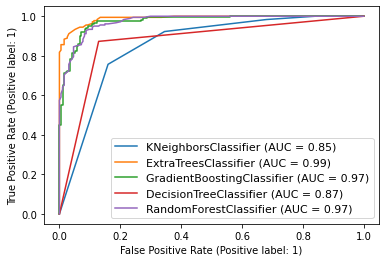

In [122]:
# For importing required libraries
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 
disp = plot_roc_curve(knn,x_test,y_test)
plot_roc_curve(ETC, x_test, y_test, ax=disp.ax_)     
plot_roc_curve(gbc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(DTC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(rfc, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

Here, the ROC AUC values are displayed above.

# Saving Model:-

In [123]:
# For importing required libraries:-
import pickle
Name='InsuranceClaimFraudDetect'
pickle.dump(FinalModel,open(Name,'wb'))

Now, here the model is saved.

# Loading Model and Predicting Values:-

In [124]:
# loading the saved model:-
LoadModel=pickle.load(open('InsuranceClaimFraudDetect','rb'))
Result=LoadModel.predict(x_test)
print(Result)

[0 1 0 1 1 1 0 0 1 1 0 0 0 1 0 1 1 0 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 1 1 0 1
 1 1 1 1 0 1 1 0 0 0 1 0 1 0 1 0 1 0 1 1 0 0 1 0 1 1 1 1 0 1 0 1 1 1 0 1 1
 1 1 1 0 1 1 0 0 1 0 0 0 0 1 1 0 0 1 1 0 0 0 1 1 0 0 0 0 0 0 0 1 0 1 1 0 1
 0 0 1 0 1 0 0 1 0 0 0 1 1 0 1 1 1 1 1 0 1 0 0 0 1 1 1 0 1 0 1 0 0 0 1 1 1
 1 0 1 1 0 0 1 1 0 1 1 1 1 1 0 0 1 1 1 1 0 1 1 1 1 0 0 0 1 0 0 0 0 1 0 1 1
 1 0 0 0 1 1 1 1 0 0 0 1 0 1 1 1 0 0 0 0 1 1 1 0 0 0 1 1 1 0 1 0 1 0 0 0 1
 1 1 1 0 1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0
 0 0 0 0 1 0 0 0 1 1 0 1 0 1 1 0 0 0 0 0 0 1 0 0 1 1 0 1 0 1 0 0 0 1 1 1 0
 1 1 1 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1 0 1 1 0 1 0 1 1 0 0 0 1 0 1 0 0 1 1 0
 0 0 1 0 1 1 1 1 0 0 1 0 0 0 0 0 0 1 1 1 0 0 1 1 1 0 0 0 1 1 1 0 1 0 1 1 1
 0 0 0 0 0]


In [125]:
pd.DataFrame([LoadModel.predict(x_test)[:],y_test[:]],index=["Predicted","Actual"])

,0,1,2,3,4,5,6,7,8,9,...,365,366,367,368,369,370,371,372,373,374
Predicted,0,1,0,1,1,1,0,0,1,1,...,1,0,1,1,1,0,0,0,0,0
Actual,0,1,0,1,1,1,0,0,1,1,...,1,0,1,0,1,0,0,0,0,0


Here, the Final Actual/ Predicted Predictions are shown above.

Thanks